# Image Processing and Object Detection

## Import Required Libraries

In [85]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Define functions
Basic image processing techniques that will be used

In [86]:
def blockout_region(image):
    points = np.array([(0, 438), (134, 452), (276, 440), (376, 438), (504, 426), (633, 413), (747, 405), 
                       (844, 405), (942, 408), (1045, 400), (1178, 400), (1287, 407), (1360, 410), 
                       (1465, 411), (1576, 413), (1638, 405), (1733, 405), (1824, 411), (1919, 413), 
                       (1919, 0), (0, 0), (0, 438)])
    return cv2.fillPoly(image, [points], (0, 0, 0))

def apply_clahe(image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

def background_subtraction(image, background):
    return cv2.subtract(image, background)

def sharpen(image):
    sharpen_kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    return cv2.filter2D(image, -1, sharpen_kernel)

def morphological_operations(image, operation, kernel_size, iterations=1):
    kernel = np.ones((kernel_size, kernel_size))
    operations = {
        "erode": cv2.erode,
        "dilate": cv2.dilate,
        "open": cv2.morphologyEx,
        "close": cv2.morphologyEx,
    }
    if operation in operations:
        if operation in ["open", "close"]:
            return operations[operation](image, getattr(cv2, f"MORPH_{operation.upper()}"), kernel, iterations=iterations)
        return operations[operation](image, kernel, iterations=iterations)
    return image

def gaussian_blur(image, kernel_size):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

def median_filter(image, kernel_size):
    return cv2.medianBlur(image, kernel_size)

def canny(image, low_threshold, high_threshold):
    return cv2.Canny(image, low_threshold, high_threshold)

def threshold(image, low_threshold, high_threshold, threshold_type):
    _, thresholded = cv2.threshold(image, low_threshold, high_threshold, threshold_type)
    return thresholded

## Load images and annotatins

In [87]:
def load_images_from_directory(input_folder):
    images = {}
    for filename in sorted(os.listdir(input_folder)):
        input_path = os.path.join(input_folder, filename)
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image = cv2.imread(input_path)
            if image is not None:
                images[filename] = image
            else:
                print(f"Skipping {filename}, unable to read.")
    return images

def load_annotations(annotations_csv):
    annotations = {}
    with open(annotations_csv, 'r') as file:
        next(file)  
        for line in file:
            
            _, x1, y1, x2, y2, filename, _, _ = line.strip().split(',')
            if filename not in annotations:
                annotations[filename] = []
            annotations[filename].append((int(x1), int(y1), int(x2), int(y2)))
    return annotations

## Bounding box functions
Find them based on contours, apply Non-maximum supression to them and get IOU of two bounding boxes

In [88]:
def find_bounding_boxes(image, patch, stride, aspect_ratio, min_area):
    bounding_boxes = []
    for i in range(0, image.shape[0] - patch, stride):
        for j in range(0, image.shape[1] - patch, stride):
            patch_image = image[i:i+patch, j:j+patch]
            contours, _ = cv2.findContours(patch_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            filtered_contours = []
            for contour in contours:
                x, y, w, h = cv2.boundingRect(contour)
                contour_aspect_ratio = w / h
                contour_area = cv2.contourArea(contour)
                if contour_aspect_ratio < aspect_ratio and contour_area > min_area:
                    filtered_contours.append(contour)
            for contour in filtered_contours:
                x, y, w, h = cv2.boundingRect(contour)
                x += j
                y += i
                bounding_boxes.append((x, y, x + w, y + h))
    return bounding_boxes

In [89]:
def apply_nms(bounding_boxes, nms_threshold=0.92):
    indices = cv2.dnn.NMSBoxes(bounding_boxes, [1] * len(bounding_boxes), 0, nms_threshold)
    return [bounding_boxes[i] for i in indices]

In [90]:
def get_iou(bbox1, bbox2):
    ixmin = max(bbox1[0], bbox2[0])
    iymin = max(bbox1[1], bbox2[1])
    ixmax = min(bbox1[2], bbox2[2])
    iymax = min(bbox1[3], bbox2[3])
    
    iw = max(0, ixmax - ixmin)
    ih = max(0, iymax - iymin)
    intersection_area = iw * ih
    
    bbox1_area = (bbox1[2] - bbox1[0]) * (bbox1[3] - bbox1[1])
    bbox2_area = (bbox2[2] - bbox2[0]) * (bbox2[3] - bbox2[1])
    
    union_area = bbox1_area + bbox2_area - intersection_area
    
    iou = intersection_area / union_area if union_area > 0 else 0
    return iou

## Evaluation
Evaluate the performance of the object detection using precision, recall and F1-score for object level metrics. Also plot expected vs predicted count of number of people

In [91]:
def evaluate_detections(real_bboxes, predicted_bboxes, iou_threshold=0.2):
    
    true_positives = 0
    false_positives = 0
    false_negatives = 0
    ious = []

    for pred_bbox in predicted_bboxes:
        matched = False
        for real_bbox in real_bboxes:
            iou = get_iou(pred_bbox, real_bbox)
            ious.append(iou)
            if iou >= iou_threshold:
                matched = True
                break
        
        if matched:
            true_positives += 1
        else:
            false_positives += 1
    
    for real_bbox in real_bboxes:
        matched = False
        for pred_bbox in predicted_bboxes:
            iou = get_iou(pred_bbox, real_bbox)
            if iou >= iou_threshold:
                matched = True
                break
        if not matched:
            false_negatives += 1

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0
    accuracy = true_positives / len(real_bboxes) if len(real_bboxes) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    metrics = {
        'true_positives': true_positives,
        'false_positives': false_positives,
        'false_negatives': false_negatives,
        'accuracy': accuracy,
        'recall': recall,
        'precision': precision,
        'f1': f1,
        'real_bboxes': len(real_bboxes),
        'predicted_bboxes': len(predicted_bboxes),
        'mse': (len(real_bboxes) - len(predicted_bboxes)) ** 2,
    }
    
    return metrics

In [92]:
def comparison(real_vs_detected):
    real_counts = [x[0] for x in real_vs_detected]  
    predicted_counts = [x[1] for x in real_vs_detected]  
    filenames = [x[2] for x in real_vs_detected] 
    
    plt.figure(figsize=(12, 6))
    plt.plot(filenames, real_counts, label="Real Bounding Boxes", marker='o', linestyle='-')
    plt.plot(filenames, predicted_counts, label="Predicted Bounding Boxes", marker='x', linestyle='--')

    plt.title("Comparison of Real vs Predicted Bounding Boxes")
    plt.xlabel("Images")
    plt.ylabel("Count of Bounding Boxes")
    plt.xticks(rotation=45, ha="right")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()  
    plt.show()


## Visualization

In [93]:
def draw_bounding_boxes(image, bounding_boxes, color):
    for (x1, y1, x2, y2) in bounding_boxes:
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
    return image

In [94]:
def display_image(image, title="Image", info=None):
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title, fontsize=16)
    plt.axis('off')

    if info:
        info_text = '\n'.join([f"{key}: {value:.2f}" if isinstance(value, float) else f"{key}: {value}" 
                               for key, value in info.items()])
        plt.gcf().text(0.95, 0.5, info_text, fontsize=12, va='center', ha='left', 
                       bbox=dict(facecolor='white', alpha=0.7))
    plt.show()

## Preprocess images
Use image processing functions defined previously to prepare the image for object detection. Plot the intermediate steps

In [95]:
def preprocess_image(image, background, show=False, filename=None):
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image_blockout = blockout_region(image_gray.copy())
    image_clahe = apply_clahe(image_blockout)
    image_gaussian = gaussian_blur(image_clahe, 5)
    image_subtraction = background_subtraction(background, image_gaussian)
    image_sharpen = sharpen(image_subtraction)
    image_median = median_filter(image_sharpen, 5)
    image_threshold = threshold(image_median, 70, 255, cv2.THRESH_TOZERO)
    image_binarize = threshold(image_threshold, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    image_canny = canny(image_binarize, 100, 200)
    image_close = morphological_operations(image_canny, "close", 5)
    
    if show:
        image_name = os.path.splitext(os.path.basename(filename))[0] if filename else "Image"
        images = [
            (f"1. {image_name}", cv2.cvtColor(image, cv2.COLOR_BGR2RGB)),
            ("2. Grayscale", image_gray),
            ("3. Blocked Out", image_blockout),
            ("4. CLAHE Applied", image_clahe),
            ("5. Gaussian Blurred", image_gaussian),
            ("6. Background Subtracted", image_subtraction),
            ("7. Sharpened", image_sharpen),
            ("8. Median Filtered", image_median),
            ("9. Thresholded (70,255)", image_threshold),
            ("10. Binarized (Otsu)", image_binarize),
            ("11. Canny Edge", image_canny),
            ("12. Morphologically Closed", image_close)
        ]

        plt.figure(figsize=(20, 8))
        for idx, (title, img) in enumerate(images):
            plt.subplot(3, 4, idx + 1)
            plt.imshow(img, cmap='gray')
            plt.title(title)
            plt.axis('off')

    return image_close


## Main
Steps:
1. Load images and annotations
2. Prepare background image
3. For every image:
    1. Preprocess it
    2. Find bounding boxes and apply Non-maximum supression
    3. Calculate object-level metrics 
    4. Plot real vs predicted detections
4. Plot image-level metrics
5. Print average metrics (object-level + image-level)
    

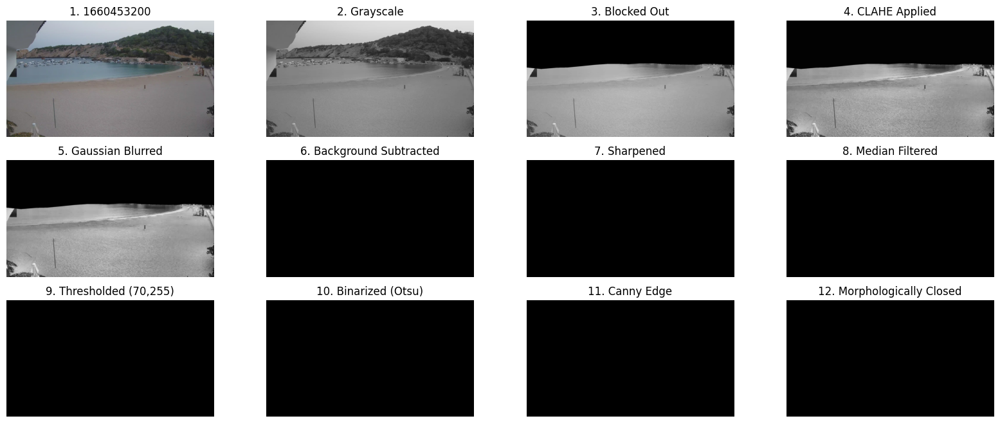

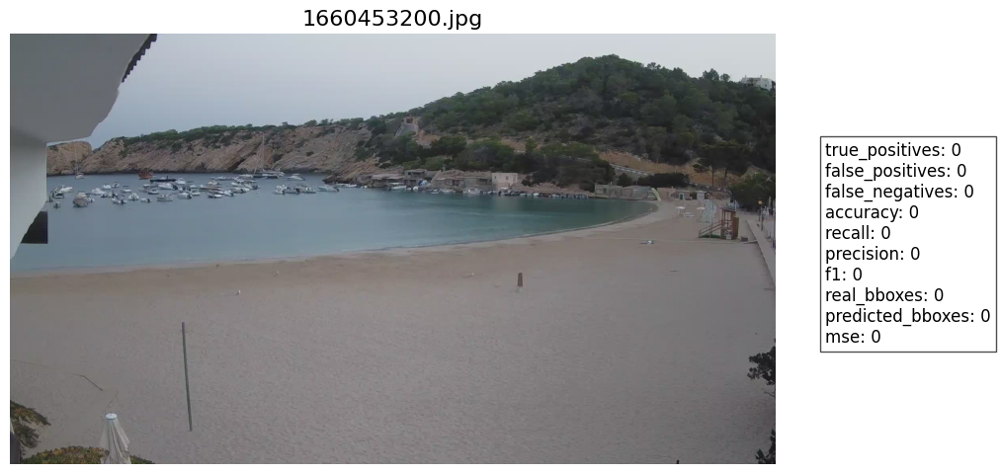

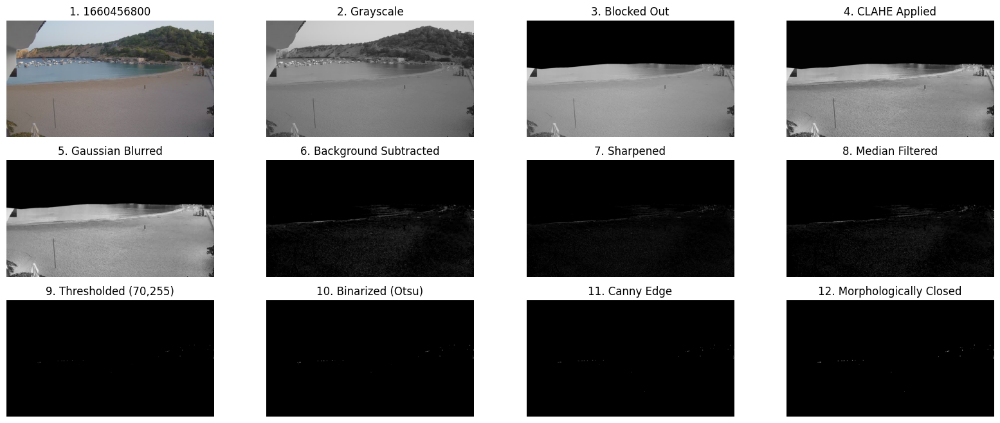

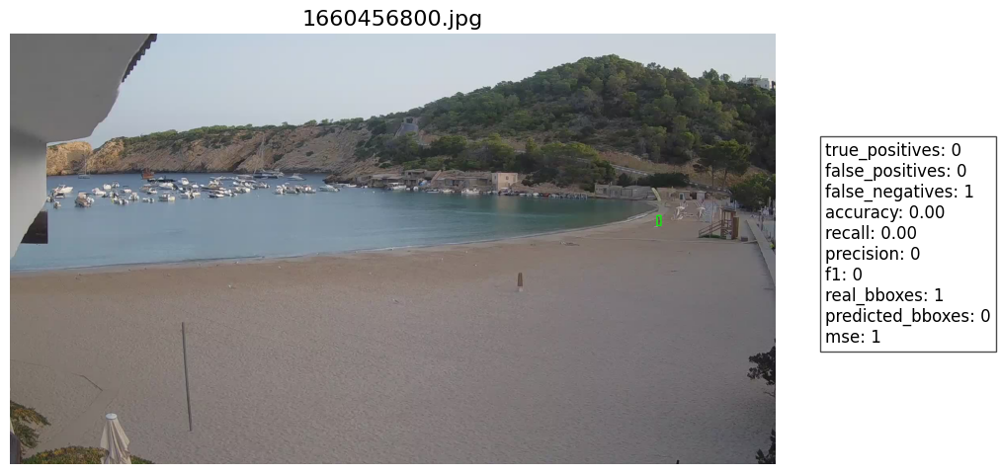

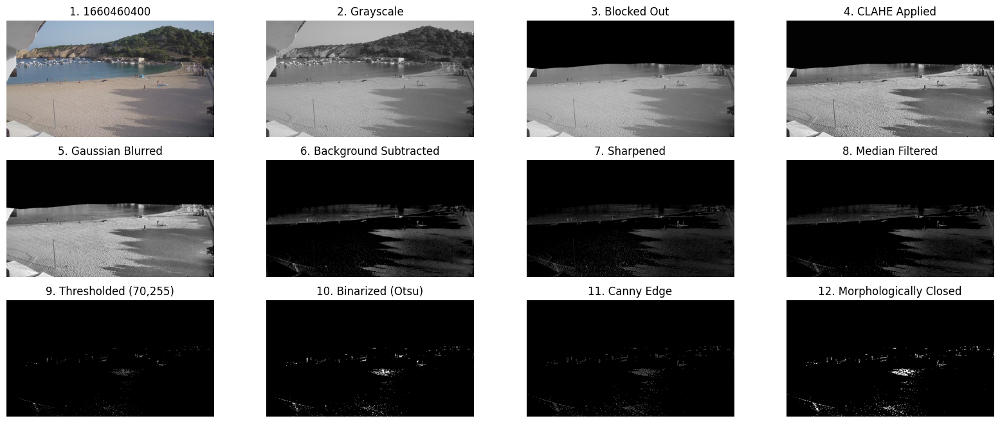

...

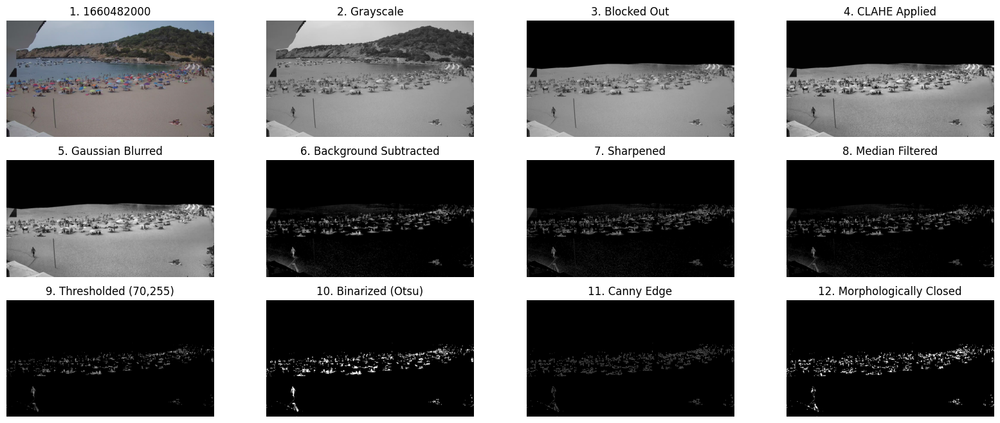

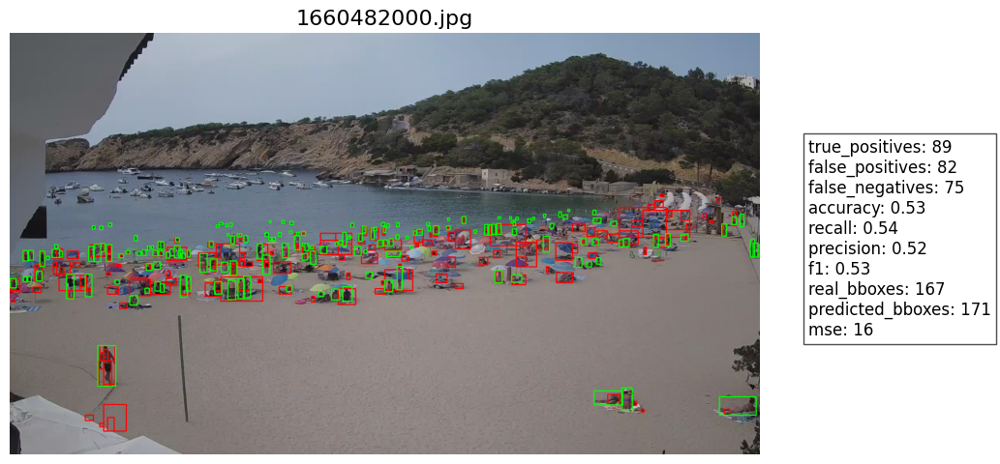

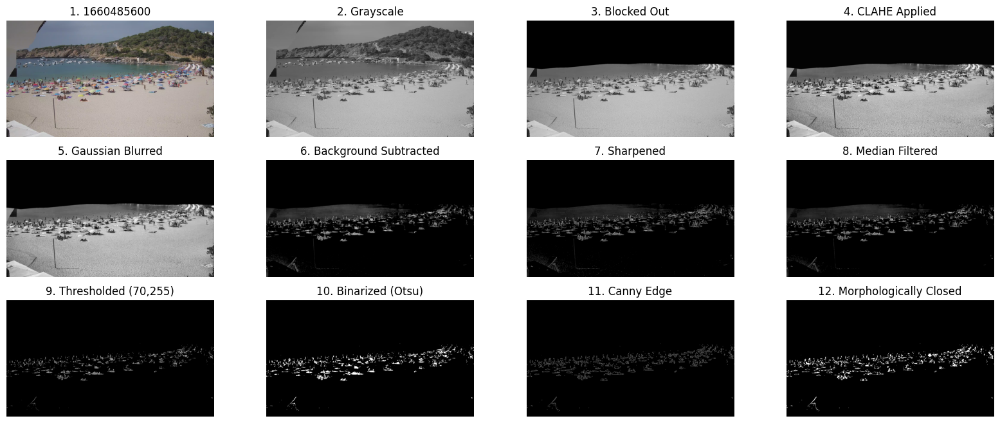

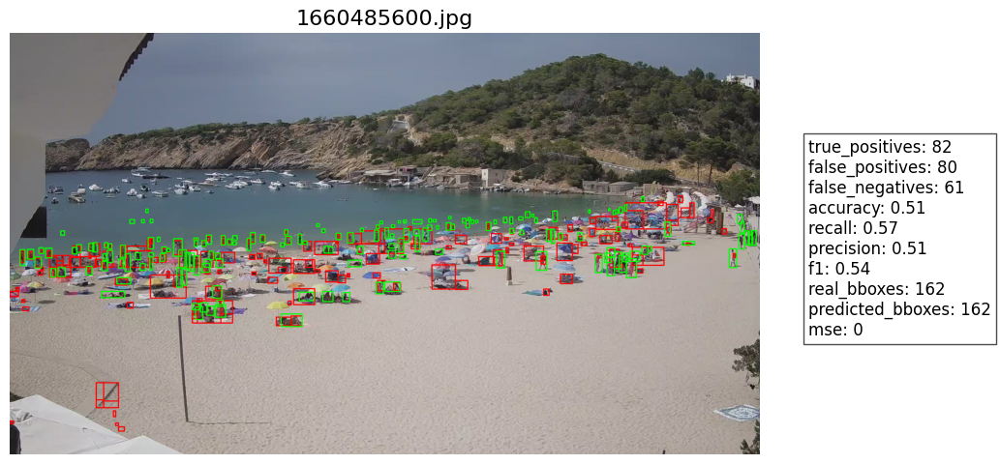

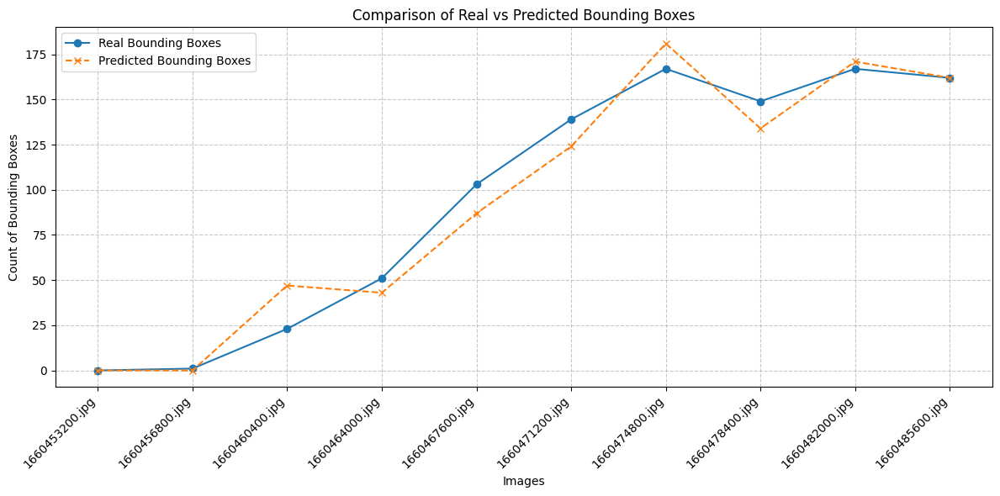

{'accuracy': 0.40473767366684965, 'recall': 0.41234596640331145, 'precision': 0.38537996383113404, 'f1': 0.3923457747963682, 'mse': 155.9}


In [96]:
input_folder = 'data/images'
output_folder = 'data/main'
annotations_csv = 'annotations.csv'
os.makedirs(output_folder, exist_ok=True)

images = load_images_from_directory(input_folder)
annotations = load_annotations(annotations_csv)

background_image = images.get("1660453200.jpg")
if background_image is not None:
    background = cv2.cvtColor(background_image, cv2.COLOR_BGR2GRAY)
    background = blockout_region(background)
    background = apply_clahe(background)
    background = gaussian_blur(background, 5)
    
avg_metrics = {
    'accuracy': 0,
    'recall': 0,
    'precision': 0,
    'f1': 0,
    'mse': 0,
}
real_vs_detected = []
for filename, image in images.items():
    preprocessed_image = preprocess_image(image.copy(), background, show=True, filename=filename)
    
    predicted_bboxes = find_bounding_boxes(preprocessed_image, patch=120, stride=60, aspect_ratio=1.8, min_area=25)
    predicted_bboxes = apply_nms(predicted_bboxes)
    
    real_bboxes = annotations.get(filename, [])
    
    final_image = draw_bounding_boxes(image, predicted_bboxes, (0, 0, 255))
    final_image = draw_bounding_boxes(final_image, real_bboxes, (0, 255, 0))
    
    metrics = evaluate_detections(real_bboxes, predicted_bboxes, iou_threshold=0.05)
    display_image(final_image, title=filename, info=metrics)

    avg_metrics["accuracy"] += metrics["accuracy"]
    avg_metrics["recall"] += metrics["recall"]
    avg_metrics["precision"] += metrics["precision"]
    avg_metrics["f1"] += metrics["f1"]
    avg_metrics["mse"] += metrics["mse"]
    
    real_vs_detected.append((metrics["real_bboxes"], metrics["predicted_bboxes"], filename))

comparison(real_vs_detected)

for key in avg_metrics:
    avg_metrics[key] /= len(images)

print(avg_metrics)
    